# **Summary**

# **Imports**

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from scipy import stats
import math
from sklearn.feature_selection import mutual_info_classif, SelectKBest, chi2, f_classif, RFE, RFECV
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, OrdinalEncoder, label_binarize
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, KFold, train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from plotly.subplots import make_subplots
from imblearn.over_sampling import SMOTE
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from xgboost import XGBClassifier

# **Data Preprocessing**

In [2]:
diab_df=pd.read_csv('/Users/vladandreichuk/Desktop/Comparative-Analysis-of-ML-Algorithms-Predicting-Hospital-Readmission-of-Diabetes-Patients/diabetic_data.csv')

## **Preliminary Feature Cleaning**

In [3]:
# Display the top rows of the dataset
diab_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [4]:
# Display the summary of the columns
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [5]:
#Since missing values are represented as ?, change them to NaN
diab_df.replace('?', np.nan, inplace=True)

In [6]:
# Prevent 'None' values being interpreted as np.nan
diab_df['A1Cresult'] = diab_df['A1Cresult'].replace(np.nan,'No')
diab_df['max_glu_serum'] = diab_df['max_glu_serum'].replace(np.nan,'No')

In [7]:
# Find columns with only one unique value
single_unique_columns = diab_df.columns[diab_df.nunique() == 1]

single_unique_columns

Index(['examide', 'citoglipton'], dtype='object')

In [8]:
# Drop irrelevant columns from the DataFrame
columns_to_drop = ['encounter_id', 'patient_nbr', 'payer_code','examide','citoglipton']
diab_df = diab_df.drop(columns_to_drop, axis=1)

In [9]:
# Delete all rows where patients deceseased since there is no possibility for them to be readmitted
# List of IDs that correspond to dead patients based on the mapping provided with the dataset
values_to_remove = [11, 19, 20, 21]

# Filter and remove rows with 'discharge_disposition_id' in the specified values
diab_df = diab_df[~diab_df['discharge_disposition_id'].isin(values_to_remove)]

## **Missing Values**

In [20]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100114 entries, 0 to 101765
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      97875 non-null   object
 1   gender                    100114 non-null  object
 2   age                       100114 non-null  object
 3   weight                    3156 non-null    object
 4   admission_type_id         100114 non-null  int64 
 5   discharge_disposition_id  100114 non-null  int64 
 6   admission_source_id       100114 non-null  int64 
 7   time_in_hospital          100114 non-null  int64 
 8   medical_specialty         50985 non-null   object
 9   num_lab_procedures        100114 non-null  int64 
 10  num_procedures            100114 non-null  int64 
 11  num_medications           100114 non-null  int64 
 12  number_outpatient         100114 non-null  int64 
 13  number_emergency          100114 non-null  int64 
 14  number_in

In [10]:
#Drop 'weight' column due to largely missing values
diab_df = diab_df.drop(['weight','medical_specialty'], axis=1)


In [11]:
# Display the missing values count for each feature
diab_df.isnull().sum()


race                        2239
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
diag_1                        21
diag_2                       358
diag_3                      1421
number_diagnoses               0
max_glu_serum                  0
A1Cresult                      0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose  

In [12]:
# Impute the missing values in the race column with its mode
diab_df['race'].fillna(diab_df['race'].mode()[0], inplace=True)


In [13]:
# Impute the missing values in the 'diag' columns with 'Unknown'
cols_to_impute = ['diag_1', 'diag_2', 'diag_3']
for col in cols_to_impute:
    diab_df[col].fillna('Unknown', inplace=True)

In [14]:
diab_df.isnull().sum()

race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide

## **Duplicates**

In [15]:
# Check for and remove duplicate rows
diab_df.drop_duplicates(inplace=True)

## **Outliers**

In [16]:
def readmitted_by_feature(metric):
    """
    This function groups the data by the specified 'metric' and 'readmitted' status, calculates the percentage of readmitted patients for each category, and creates a bar plot using Plotly Express.
    The resulting plot displays the distribution of readmission percentages across categories of the specified 'metric,' providing insights into how different factors may affect patient readmission rates.

    Parameters:
        metric (str): The name of the feature (column) used for grouping data and creating the bar plot.
    """
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, 'readmitted']).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    total_counts = grouped_data.sum(axis=1)
    for col in grouped_data.columns:
        grouped_data[col] = (grouped_data[col] / total_counts) * 100

    # Calculate the sum of percentages in '<30' and '>30' categories and sort by it
    grouped_data['sum_percentages'] = grouped_data['<30'] + grouped_data['>30']
    grouped_data = grouped_data.sort_values(by='sum_percentages', ascending=True)
    grouped_data.drop(columns='sum_percentages', inplace=True)

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Create the bar plot using Plotly
    fig = px.bar(grouped_data_reset, x=metric, y=['<30', '>30', 'NO'], barmode='relative',
                 labels={metric: metric, 'value': 'Percentage'},
                 color_discrete_sequence=px.colors.qualitative.Pastel,
                 title=f'Readmission Patient Percentage by {metric}')

    # Customize the plot layout
    fig.update_layout(xaxis_title=metric, yaxis_title='Percentage', legend_title_text='Readmission Category')

    # Display the plot
    fig.show()

In [18]:
def boxplot_num_vars(df, columns, names, show_percentages):
    """
    This function generates a set of subplots with boxplots for the specified columns, each subplot labeled with the provided titles.
    
    Parameters:
        df (DataFrame): The DataFrame containing the data.
        columns (list): A list of column names to create boxplots for.
        names (list): A list of titles for the boxplots.
        show_percentages (bool, optional): If True, display the percentage of outliers next to each boxplot. Default is False.
    """
    # Create subplots
    fig = sp.make_subplots(rows=2, cols=4, subplot_titles=names, vertical_spacing=0.1)

    # Create boxplots for each column
    for i, column in enumerate(columns):
        row = i // 4 + 1
        col = i % 4 + 1

        # Calculate Z-scores for the current column
        z_scores = stats.zscore(df[column])

        # Identify outliers based on Z-scores
        outliers = (z_scores > 3) | (z_scores < -3)  # You can adjust the threshold if needed

        # Compute the percentage of outliers
        percentage_outliers = (sum(outliers) / len(df)) * 100

        # Create the subtitle with or without the percentage of outliers
        if show_percentages==True:
            fig.layout.annotations[i].update(text=f'{names[i]} (Outliers: {percentage_outliers:.2f}%)')


        trace = go.Box(y=df[column], name=names[i], boxmean=True, orientation='v')
        fig.add_trace(trace, row=row, col=col)

        # Remove y-axis tick labels
        fig.update_xaxes(showticklabels=False, row=row, col=col)

    # Update layout
    fig.update_layout(
        title="Distributions of Numerical Variables",
        showlegend=False
    )

    # Show the plot
    fig.show()

In [19]:
# Define the columns of interest and corresponding names
columns_of_interest = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
                        'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']
names = ['Time in Hospital (Days)', 'Lab Procedures', 'Procedures', 'Medications',
         'Outpatient Visits', 'Emergency Room Visits', 'Inpatient Visits', 'Diagnoses']

In [20]:
# Visualize the outliers
boxplot_num_vars(diab_df, columns_of_interest, names,show_percentages=True)

In [21]:
# Create a column indicating if the patient is an outlier or not

# Specify the threshold for Z-score
threshold = 3

# Calculate Z-scores for all numerical columns
z_scores = stats.zscore(diab_df.select_dtypes(include=['number']))

# Identify outliers based on Z-scores
outliers = (z_scores > threshold).any(axis=1)

# Create the 'outliers' column in the DataFrame
diab_df['outliers'] = outliers

# Check how many outliers are there
diab_df['outliers'].value_counts()

outliers
False    90042
True     10072
Name: count, dtype: int64

In [22]:
# Create a bar plot to visualize the distribution of 'readmitted' with respect to outliers
readmitted_by_feature('outliers')

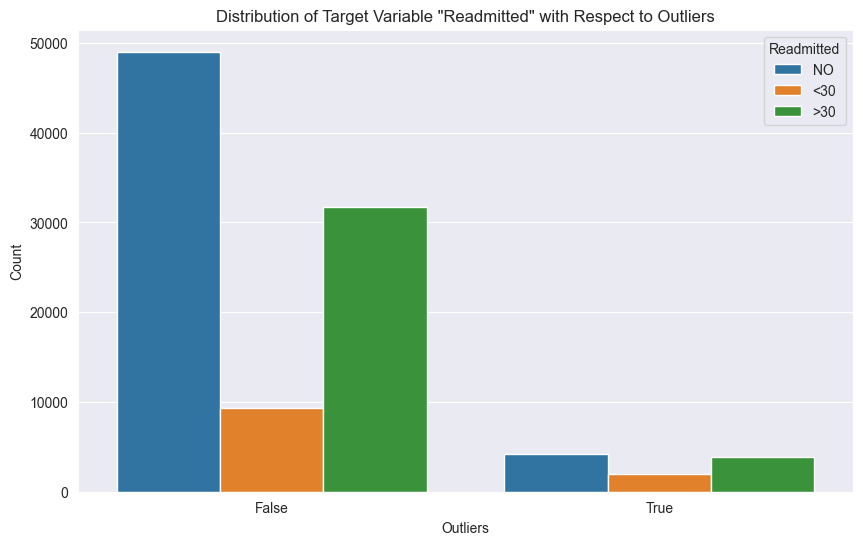

In [23]:
# Create an alternative bar plot to visualize the distribution of 'readmitted' with respect to outliers
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
sns.countplot(x='outliers', hue='readmitted', data=diab_df,hue_order=['NO','<30','>30'])

# Customize the plot
plt.title('Distribution of Target Variable "Readmitted" with Respect to Outliers')
plt.xlabel('Outliers')
plt.ylabel('Count')
plt.legend(title='Readmitted', loc='upper right')

# Show the plot
plt.show()


## **Feature Engineering**

In [24]:
# Convert specified columns to 'object' type 
diab_df['admission_type_id'] = diab_df['admission_type_id'].astype('object')
diab_df['discharge_disposition_id'] = diab_df['discharge_disposition_id'].astype('object')
diab_df['admission_source_id'] = diab_df['admission_source_id'].astype('object')

In [26]:
# Check the distribution of a potentially highly skewed feature
diab_df['number_inpatient'].value_counts(normalize = True)

number_inpatient
0     0.665961
1     0.191412
2     0.073736
3     0.033172
4     0.015862
5     0.007991
6     0.004765
7     0.002637
8     0.001458
9     0.001109
10    0.000589
11    0.000489
12    0.000340
13    0.000180
14    0.000100
15    0.000090
16    0.000060
19    0.000020
17    0.000010
21    0.000010
18    0.000010
Name: proportion, dtype: float64

In [ ]:
# Binarise the highly skewed columns and rename them
diab_df['outpatient'] = np.where(diab_df['number_outpatient']==0,0,1)
diab_df['emergency'] = np.where(diab_df['number_emergency']==0,0,1)
diab_df = diab_df.drop('number_outpatient',axis=1)
diab_df = diab_df.drop('number_emergency',axis=1)


In [35]:
def convert_to_float(data, col):
    """
    Convert a specific column in a DataFrame to float, handling mixed values.

    Parameters:
      data (pd.DataFrame): The DataFrame containing the data.
      col (str): The name of the column to be converted.

    Returns:
        data (d.DataFrame): The DataFrame with the specified column converted to float.
    """

    # Loop through each row in the specified column
    for i, value in enumerate(data[col]):
        try:
            # Attempt to convert the value to float
            data.at[i, col] = float(value)
        except ValueError:
            # If conversion fails, set the value to a default float value (e.g., -1)
            data.at[i, col] = float(-1)

    return data

# Convert codes into floats for future processing
diab_df = convert_to_float(diab_df, 'diag_1')
diab_df = convert_to_float(diab_df, 'diag_2')
diab_df = convert_to_float(diab_df, 'diag_3')

In [36]:
def assign_group(code):
    """
    Assign a medical group based on the ICD-9 code.

    Parameters:
      code (int): The ICD-9 code to be categorized.

    Returns:
    str: The medical group corresponding to the provided ICD-9 code.
         Possible groups include 'Circulatory', 'Respiratory', 'Digestive',
         'Diabetes', 'Injury', 'Musculoskeletal', 'Genitourinary', 'Neoplasm',
         or 'Other'.
    """
    if 390 <= code <= 459 or code == 785:
        return 'Circulatory'
    elif 460 <= code <= 519 or code == 786:
        return 'Respiratory'
    elif 520 <= code <= 579 or code == 787:
        return 'Digestive'
    elif 250 <= code < 251:
        return 'Diabetes'
    elif 800 <= code <= 999:
        return 'Injury'
    elif 710 <= code <= 739 :
        return 'Musculoskeletal'
    elif 580 <= code <= 629 or code == 788 :
        return 'Genitourinary'
    elif 140 <= code <= 239:
        return 'Neoplasm'
    elif 780 <= code <= 781 or code == 784 or 790 <= code <= 799:
        return 'Neoplasm'
    elif 240 <= code <= 279:
        return 'Neoplasm'
    elif 680 <= code <= 709 or code == 782:
        return 'Neoplasm'
    elif 1 <= code <= 139:
        return 'Neoplasm'
    elif 290 <= code <= 319:
        return 'Neoplasm'
    else:
        return 'Other'

# Apply the function to 'diag_1', 'diag_2', and 'diag_3' columns
diab_df['diag_1'] = diab_df['diag_1'].map(assign_group)
diab_df['diag_2'] = diab_df['diag_2'].map(assign_group)
diab_df['diag_3'] = diab_df['diag_3'].map(assign_group)

In [37]:
diab_df['diag_1'].value_counts()

diag_1
Circulatory        30395
Neoplasm           16169
Respiratory        14342
Digestive           9521
Diabetes            8833
Injury              6984
Other               5339
Genitourinary       5148
Musculoskeletal     5035
Name: count, dtype: int64

In [38]:
diab_df.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,outliers,outpatient,emergency
0,Caucasian,Female,[0-10),6,25,1,1.0,41.0,0.0,1.0,...,No,No,No,No,No,No,NO,True,0.0,0.0
1,Caucasian,Female,[10-20),1,1,7,3.0,59.0,0.0,18.0,...,No,No,No,No,Ch,Yes,>30,False,0.0,0.0
2,AfricanAmerican,Female,[20-30),1,1,7,2.0,11.0,5.0,13.0,...,No,No,No,No,No,Yes,NO,False,1.0,0.0
3,Caucasian,Male,[30-40),1,1,7,2.0,44.0,1.0,16.0,...,No,No,No,No,Ch,Yes,NO,False,0.0,0.0
4,Caucasian,Male,[40-50),1,1,7,1.0,51.0,0.0,8.0,...,No,No,No,No,Ch,Yes,NO,False,0.0,0.0


# **Dimensionality Reduction**

## **Correlation Analysis**

In [39]:
# Select only the numeric columns for correlation analysis
num_cols_df= diab_df.select_dtypes(include=['number'])

# Calculate the correlation matrix for the numeric columns
correlation_matrix = num_cols_df.corr()

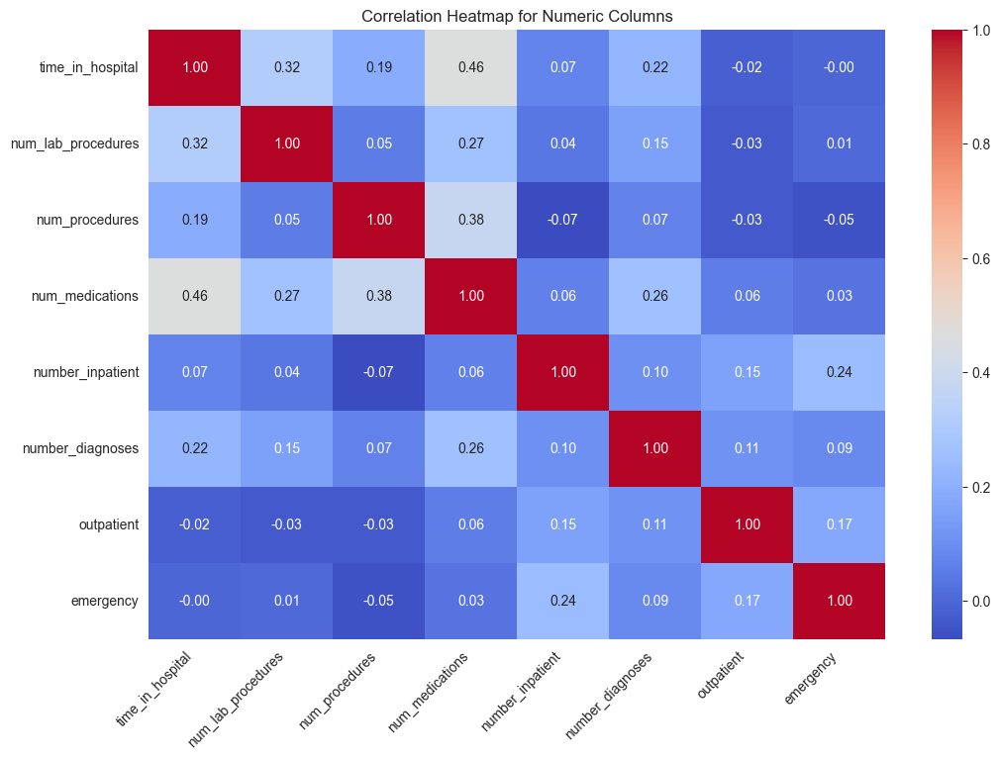

In [40]:
# Create a heatmap
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Rotate x-ticks
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right')
plt.title("Correlation Heatmap for Numeric Columns")
plt.show()

## **Chi2 Analysis**

In [41]:
# Separate the target variable from the features
X = diab_df.drop(columns=['readmitted'])  # Features
y = diab_df['readmitted']  # Target variable

# Format all fields as string
X_str = X.astype(str)

# Encode input data using OrdinalEncoder
def encode_inputs(X):
    oe = OrdinalEncoder()
    oe.fit(X)
    X_enc = oe.transform(X)
    return X_enc


# Encode target variable using LabelEncoder
def encode_targets(y):
    le = LabelEncoder()
    le.fit(y)
    y_enc = le.transform(y)
    return y_enc

In [42]:
# Transform X
X_enc = encode_inputs(X_str)

# Transform y
y_enc = encode_targets(y)

In [43]:
# Apply Chi2 using SelectKBest
def skb_chi2(X, y):
    fs = SelectKBest(score_func=chi2, k='all')
    fs.fit(X, y)
    return fs

In [47]:
results_scores =[]

# Get the average Chi2 results
for i in range(100):
    results = skb_chi2(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_chi2_results = np.mean(results_scores,axis=0)   

In [49]:
# Print all the Chi2 values for all features
for i in range(len(skb_chi2_results)):
    print(f'Feature {X.columns[i]}: {skb_chi2_results[i]}')

 # Visualize the Chi2 values for each feature on a log scale in ascending order         
fig = px.bar(x = X.columns, y = skb_chi2_results,log_y=True)
fig.update_layout(xaxis={'categoryorder':'total ascending'}, title="Chi-squared values for all features and 'readmitted' target variable", yaxis_title="Chi2 (Log10 scale)", xaxis_title="Features") 
fig.update_xaxes(tickangle=-45)

Feature race: 10499.357702765732
Feature gender: 20818.246368798198
Feature age: 4120.808140197263
Feature admission_type_id: 69210.03609616963
Feature discharge_disposition_id: 79375.35185845308
Feature admission_source_id: 12188.039871743205
Feature time_in_hospital: 13286.446354181131
Feature num_lab_procedures: 104174.18130412811
Feature num_procedures: 37055.078781601616
Feature num_medications: 247876.04946147025
Feature number_inpatient: 287040.2499521821
Feature diag_1: 12.057389078981917
Feature diag_2: 9.798238419670612
Feature diag_3: 7.3086781858585255
Feature number_diagnoses: 1262.0465377234825
Feature max_glu_serum: 3272.322630016651
Feature A1Cresult: 3748.170053776217
Feature metformin: 10282.299240969034
Feature repaglinide: 13607.72246530301
Feature nateglinide: 13792.677324956518
Feature chlorpropamide: 13927.529134687495
Feature glimepiride: 12866.496694191801
Feature acetohexamide: 200165.4178102874
Feature glipizide: 11511.289125620538
Feature glyburide: 11872.03

In [51]:
# Create a temporary DataFrame to store the results 
chi2_results_df = pd.DataFrame({'Feature': X.columns,
                                'Chi-squared Statistic': skb_chi2_results})

# Sort rows by the Chi2 values in ascending order
chi2_results_df_sorted = chi2_results_df.sort_values(by='Chi-squared Statistic',ascending=True)

# Select 22 features (half of the total number of features) with lowest Chi2
cols_to_drop_chi2 = list(chi2_results_df_sorted[:22]['Feature'])
cols_to_drop_chi2


['diag_3',
 'diag_2',
 'diag_1',
 'number_diagnoses',
 'diabetesMed',
 'max_glu_serum',
 'A1Cresult',
 'age',
 'change',
 'insulin',
 'metformin',
 'race',
 'glipizide',
 'glyburide',
 'admission_source_id',
 'pioglitazone',
 'rosiglitazone',
 'glimepiride',
 'time_in_hospital',
 'repaglinide',
 'nateglinide',
 'glyburide-metformin']

## **Mutual Information Analysis**

In [53]:
# Apply MI using SelectKBest
def skb_mut_inf(X, y):
    fs = SelectKBest(score_func=mutual_info_classif, k='all')
    fs.fit(X, y)
    return fs

In [54]:
results_scores =[]

# Get the avergae MI results
for i in range(10):
    results = skb_mut_inf(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_mi_results = np.mean(results_scores,axis=0)  

In [55]:
# Show the scores for the features
for i in range(len(skb_mi_results)):
    print(f'Feature {X.columns[i]}: {skb_mi_results[i]}')
    
# Visualize the MI values for each feature in ascending order        
fig = px.bar(x = X.columns, y = skb_mi_results)
fig.update_layout(xaxis={'categoryorder':'total ascending'}, title="MI values for all features and 'readmitted' target variable", yaxis_title="Mutual information",xaxis_title="Features") 
fig.update_xaxes(tickangle=-45)

Feature race: 0.0918669718153606
Feature gender: 0.08649744066782658
Feature age: 0.08588075008611096
Feature admission_type_id: 0.08489270732033657
Feature discharge_disposition_id: 0.09431062237096215
Feature admission_source_id: 0.0940407220656814
Feature time_in_hospital: 0.08716707474508309
Feature num_lab_procedures: 0.08528684471903925
Feature num_procedures: 0.08606015021487164
Feature num_medications: 0.08798529833346287
Feature number_inpatient: 0.11572177279711801
Feature diag_1: 0.0014284533355253925
Feature diag_2: 0.0014438042349789848
Feature diag_3: 0.0012880406980409153
Feature number_diagnoses: 0.09258848328378715
Feature max_glu_serum: 0.09182203545019312
Feature A1Cresult: 0.0895189360815074
Feature metformin: 0.08822012678493503
Feature repaglinide: 0.09251160431970099
Feature nateglinide: 0.09280652711255628
Feature chlorpropamide: 0.09127867431316503
Feature glimepiride: 0.09248980369458323
Feature acetohexamide: 0.08305891240513189
Feature glipizide: 0.088168863

In [56]:
# Create a temporary DataFrame to store the results 
mi_results_df = pd.DataFrame({'Feature': X.columns,
                                  'MI Statistic': skb_mi_results})

# Sort rows by the MI values in ascending order
mi_results_df_sorted = mi_results_df.sort_values(by='MI Statistic',ascending=True)

# Select 22 features (to match the size of the previous result) with lowest MI
cols_to_drop_mi = list(mi_results_df_sorted[:22]['Feature'])
cols_to_drop_mi

['diag_3',
 'diag_1',
 'diag_2',
 'metformin-rosiglitazone',
 'tolbutamide',
 'tolazamide',
 'metformin-pioglitazone',
 'troglitazone',
 'glimepiride-pioglitazone',
 'acetohexamide',
 'glipizide-metformin',
 'admission_type_id',
 'num_lab_procedures',
 'age',
 'num_procedures',
 'gender',
 'change',
 'time_in_hospital',
 'glyburide',
 'outliers',
 'num_medications',
 'glipizide']

## **ANOVA F-test Analysis**

In [57]:
# Apply F-test using SelectKBest
def skb_anova_f(X, y):
    fs = SelectKBest(score_func=f_classif, k='all')
    fs.fit(X, y)
    return fs

In [58]:
results_scores =[]

# Get the average F-test results
for i in range(100):
    results = skb_anova_f(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_anova_f_results = np.mean(results_scores,axis=0)    

In [59]:
# Show the scores for the features
for i in range(len(skb_anova_f_results)):
    print(f'Feature {X.columns[i]}: {skb_anova_f_results[i]}')

# Visualize the ANOVA f-test values for each feature in ascending order        
fig = px.bar(x = X.columns, y = skb_anova_f_results)
fig.update_layout(xaxis={'categoryorder':'total ascending'}, title="ANOVA f-test values for all features and 'readmitted' target variable", yaxis_title="ANOVA f-test values",xaxis_title="Features") 
fig.update_xaxes(tickangle=-45)

Feature race: 8393.186736089869
Feature gender: 14282.100984790526
Feature age: 3379.799361762771
Feature admission_type_id: 12803.39712597709
Feature discharge_disposition_id: 2739.052217910472
Feature admission_source_id: 961.276423012013
Feature time_in_hospital: 2411.6723196047888
Feature num_lab_procedures: 4278.774735384253
Feature num_procedures: 6189.239919181678
Feature num_medications: 3389.6303235790115
Feature number_inpatient: 11264.664514531065
Feature diag_1: 1.511069767752457
Feature diag_2: 1.1758652736855706
Feature diag_3: 0.8799575034894932
Feature number_diagnoses: 1419.0632550577418
Feature max_glu_serum: 23527.3282998684
Feature A1Cresult: 9049.843526218094
Feature metformin: 22643.72325217241
Feature repaglinide: 268429.69125768176
Feature nateglinide: 647977.0812140702
Feature chlorpropamide: 4817978.008755492
Feature glimepiride: 81822.51529837029
Feature acetohexamide: 220513104.84012973
Feature glipizide: 34067.71444378606
Feature glyburide: 38785.3556424040

In [60]:
# Create a temporary DataFrame to store the results 
anova_f_results_df = pd.DataFrame({'Feature': X.columns,
                                'ANOVA f-test Statistic': skb_anova_f_results})

# Sort rows by the F values in ascending order
anova_f_results_df_sorted = anova_f_results_df.sort_values(by='ANOVA f-test Statistic',ascending=True)

# Select 22 features (to match the size of the previous result) with lowest F values
cols_to_drop_anova_f = list(anova_f_results_df_sorted[:22]['Feature'])
cols_to_drop_anova_f

['diag_3',
 'diag_2',
 'diag_1',
 'admission_source_id',
 'number_diagnoses',
 'time_in_hospital',
 'discharge_disposition_id',
 'age',
 'num_medications',
 'num_lab_procedures',
 'change',
 'diabetesMed',
 'insulin',
 'num_procedures',
 'race',
 'A1Cresult',
 'number_inpatient',
 'admission_type_id',
 'outpatient',
 'gender',
 'emergency',
 'outliers']

## **Recursive Feature Elimination (RFE)**

In [84]:
def rfe_fs(X,y,col_names,estimator, k):

    # Initialize RFE with the estimator and the number of features to select
    selector = RFE(estimator, n_features_to_select=k)

    # Fit RFE to the dataset with a progress bar
    with tqdm(total=k, desc="RFE Progress") as pbar:
        for step in range(k):
            selector.fit(X, y)
            # Update the progress bar
            pbar.update(1)

    # Get the list of columns to delete (least important features)
    deleted_features= col_names[~selector.support_]

    # Create a DataFrame of feature importances
    feature_importances = pd.DataFrame({'Feature': col_names, 'Importance': selector.ranking_})

    # Sort the DataFrame by importance (ascending order) to arrange features from least important to most important
    feature_importances = feature_importances.sort_values(by='Importance', ascending=True)

    return selector, deleted_features, feature_importances

In [85]:
rfe_model, cols_to_drop_rfe, rfe_results_df = rfe_fs(X_enc,y_enc,X.columns,estimator=RandomForestClassifier(), k=22)

RFE Progress:   9%|▉         | 2/22 [15:50<2:37:52, 473.64s/it]

In [ ]:
# Create a bar chart to visualize RFE feature ranks
fig = px.bar(rfe_results_df, x='Feature', y='Importance')
fig.update_layout(
    title="Feature Importances (RFE)",
    yaxis_title="Importance",
    xaxis_title="Features",
    xaxis={'categoryorder': 'total descending'}  # Arrange features from least to most important
)
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_rfe)

## **Lasso**

In [70]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X_enc)

In [78]:
def lasso_fs(X, y, col_names,params,n_splits):
    """
    Perform feature selection using Lasso regression.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      col_names (list): List of column names in the feature matrix.
      params (dict): Dictionary of hyperparameters for Lasso regression.
      n_splits (int): Number of folds for cross-validation.

    Returns:
    tuple: A tuple containing the Lasso model, DataFrame with feature importances,
           and a list of excluded feature names (least important features).
    """

    # Number of Folds and adding the random state for replication
    kf=KFold(n_splits=n_splits,shuffle=True, random_state=42)

    # Initializing the Model
    model= Lasso(max_iter=1000)

    # GridSearchCV with model, params and folds.
    lasso_gs=GridSearchCV(model, param_grid=params, cv=kf)
    lasso_gs.fit(X, y)

    # Fit the model with the optimal parameters
    lasso = Lasso(alpha=lasso_gs.best_params_['alpha'], max_iter=1000)

    lasso.fit(X_enc, y_enc)

    # Get the coefficients (feature importances) 
    feature_importances = np.abs(lasso.coef_)

    # Create a DataFrame to store the feature importances
    feature_importances_df = pd.DataFrame({'Feature': col_names, 'Importance': feature_importances})

    # Sort the DataFrame by importance (ascending order) to arrange features from less important to most important
    feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=True)

    # Get the list of columns to exclude (least important features)
    excluded_feature_names = feature_importances_df[feature_importances_df['Importance'] == 0]['Feature']

    return lasso, feature_importances_df, list(excluded_feature_names)

In [ ]:
# parameters to be tested on GridSearchCV
params = {"alpha":np.arange(0.00001, 10, 500)}

# Perform Lasso Regression and extract the fetures with coefficients of 0
lasso_model, lasso_results_df , cols_to_drop_lasso = lasso_fs(X_scaled, y_enc, col_names=X.columns,params=params,n_splits=10)

In [82]:
# Create a bar chart to visualize feature importances
fig = px.bar(lasso_results_df, x='Feature', y='Importance')
fig.update_layout(
        title="Feature Importances (Lasso)",
        yaxis_title="Importance",
        xaxis_title="Features",
        xaxis={'categoryorder': 'total ascending'}  # Arrange features from less important to most important
    )
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_lasso)

Features to drop:
['metformin-pioglitazone', 'glipizide-metformin', 'chlorpropamide', 'glimepiride-pioglitazone']


## **Overall Result Across Methods**

In [ ]:
# Create a temporary DataFrame to store the results for this column
fs_total_results_df = pd.DataFrame({'Feature': X.columns,
                                  'Chi2': [True if x in cols_to_drop_chi2 else False for x in X.columns],
                                  'MI': [True if x in cols_to_drop_mi else False for x in X.columns],
                                  'ANOVA_f-test': [True if x in cols_to_drop_anova_f else False for x in X.columns],
                                  'RFE': [True if x in cols_to_drop_rfe else False for x in X.columns],
                                  'Lasso': [True if x in cols_to_drop_lasso else False for x in X.columns]})

In [ ]:
# Count how many times each feature was selected across all applied methods, store in 'Matches'
fs_total_results_df['Matches'] = fs_total_results_df.iloc[:,1:].sum(axis=1)

In [ ]:
# Select features that were selected at least 4 times
cols_to_drop = fs_total_results_df[fs_total_results_df['Matches']>=4]['Feature']

In [ ]:
diab_df_filtered = diab_df.drop(columns = cols_to_drop)

# **ML Models Implementation and Evaluation**

## **Encode Columns**

In [ ]:
# Store column names
col_names = diab_df_filtered.columns

# Define which columns should be one-hot encoded or ordinal encoded
one_hot_columns = ['race', 'gender','admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'diag_1', 'diag_2', 'diag_3',
       'max_glu_serum', 'metformin', 'repaglinide', 'nateglinide',
       'chlorpropamide', 'glimepiride', 'glipizide', 'glyburide',
       'pioglitazone', 'acarbose', 'miglitol', 'insulin',
       'glyburide-metformin', 'change', 'diabetesMed', 'outpatient', 'emergency']
ordinal_columns = ["age", 'outliers' ]

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(sparse_output=False,feature_name_combiner='concat'), one_hot_columns),
        ('ordinal', OrdinalEncoder(), ordinal_columns)
    ],
    remainder='passthrough'  # Pass through columns not specified for encoding
)

# Apply the preprocessor to the data and convert it back to a dataframe with proper feature names
diab_df_filtered = preprocessor.fit_transform(diab_df_filtered)
diab_df_filtered = pd.DataFrame(diab_df_filtered,columns=preprocessor.get_feature_names_out(col_names))

In [ ]:
# Remove prefixes ending with '__'
diab_df_filtered.columns = [col.split('__')[-1] if '__' in col else col for col in diab_df_filtered.columns]

## **Balance the Target**

In [ ]:
X_enc = diab_df_filtered.drop(columns=['readmitted'])  # New encoded features

# Resampling the minority class
sm = SMOTE(sampling_strategy='minority', random_state=42)
# Fit the model to generate the data.
X_enc_balanced, y_enc_balanced = sm.fit_resample(X_enc, y_enc)

## **Scaling and Splitting**

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_enc_balanced, y_enc_balanced , test_size=0.2, random_state=42)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## **Random Forest** 

### **Model** 

In [ ]:
def rf_model(X, y, params, nsplits, scoring_metric):
    """
    Trains a Random Forest model using grid search with stratified k-fold cross-validation.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      params (dict): Hyperparameter grid for grid search.
      nsplits (int): Number of splits for stratified k-fold cross-validation.
      scoring_metric (str): Scoring metric for model evaluation.

    Returns:
      grid_search (GridSearchCV): Grid search object containing the results.
      best_rf_model (RandomForestClassifier): Trained Random Forest model with the best hyperparameters.
    """
    # Define a Random Forest model
    rf_model = RandomForestClassifier(random_state=42)

    # Perform grid search with stratified 10-fold cross-validation
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(rf_model, param_grid, cv=cv, scoring=scoring_metric)

    # Fit the model within the loop
    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    # Train the Random Forest model with the best hyperparameters
    best_rf_model = RandomForestClassifier(**best_params, random_state=42)

    # Fit the model within the loop
    best_rf_model.fit(X_train, y_train)

    return grid_search, best_rf_model


# Set up a grid of hyperparameters to search
param_grid = {
        'n_estimators': [100, 200, 300,400],
        'max_depth': [None, 20, 30, 50, 70]
    }

# Fit the model
rf_gs, best_rf_model = rf_model(X_train, y_train, params = param_grid , nsplits = 10, scoring_metric = 'f1_weighted')

### **Predictions and Evaluation** 

In [ ]:
# Best hyperparameters
rf_gs.best_params_

In [ ]:
def evaluate_model(model, X_test, y_test):
    """
    Evaluate a machine learning model's performance on the test set.

    Parameters:
      model: Trained machine learning model.
      X_test (pd.DataFrame): Feature matrix of the test set.
      y_test (pd.Series): True labels of the test set.

    Returns:
      y_pred (np.ndarray): Predicted labels.
      y_pred_prob (np.ndarray): Predicted probabilities.
      metrics (list): List of evaluation metrics [accuracy, precision, recall, f1, roc_auc].
    """
    # Generate predictions
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')

    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print(f"ROC-AUC: {roc_auc:.2f}")


    # Confusion Matrix
    confusion_matrix_result = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_result, annot=True, fmt='d', cmap='Blues',
                xticklabels=['NO', '>30','<30'], yticklabels=['NO', '>30','<30'])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


    # Generate and plot ROC-AUC curves
    class_names = ['NO', '>30','<30']

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    n_classes = len(np.unique(y_test))  # Number of unique classes

    y_test_binary = label_binarize(y_test, classes=list(range(n_classes)))

    # Create an empty figure
    fig = go.Figure()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_binary[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

        # Add ROC curve for each class  
        fig.add_trace(go.Scatter(x=fpr[i], y=tpr[i], mode='lines', name=f'ROC curve (class {class_names[i]}) (AUC = {roc_auc[i]:.2f})'))

    # Add diagonal line for reference
    fig.add_shape(type='line', x0=0, x1=1, y0=0, y1=1, line=dict(color='navy', width=2, dash='dash'))

    # Update layout of the figure
    fig.update_layout(
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        title='ROC-AUC',
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1.05]),
        legend=dict(x=0.01, y=0.99),
    )

    fig.show()

    return y_pred, y_pred_prob , [accuracy,precision,recall,f1,roc_auc]

In [ ]:
y_pred_rf, y_pred_prob_rf, rf_metrics_list = evaluate_model(best_rf_model, X_test, y_test)